packages

In [ ]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip install transformers accelerate bitsandbytes

Looking in indexes: https://download.pytorch.org/whl/cu121
INFO: pip is looking at multiple versions of torch to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.5/780.5 MB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 58.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 67.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 111.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.6 MB/s e

In [ ]:
!pip install ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 57.6 MB/s eta 0:00:00


In [ ]:
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-rn7clxp1
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-rn7clxp1
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [ ]:
!pip install opencv-python

importation

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
import torch
import clip
from PIL import Image

In [ ]:
import cv2

In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration

In [ ]:
from transformers import AutoTokenizer, AutoModelForCausalLM, pipeline, BitsAndBytesConfig

In [ ]:
import re

In [ ]:
import math

models

In [ ]:
model = YOLO('yolov8m2_taco.pt')

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
clip_model, preprocess_clip = clip.load("ViT-B/32", device=device)

100%|███████████████████████████████████████| 338M/338M [00:37<00:00, 9.35MiB/s]


In [ ]:
processor_blip = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model_blip     = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [ ]:
model_id = "microsoft/phi-2"

# Configuration quantization 4-bit
quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16,
    bnb_4bit_use_double_quant=True,
    bnb_4bit_quant_type="nf4"
)

# Chargement tokenizer + modèle
tokenizer = AutoTokenizer.from_pretrained(model_id)
model_phi = AutoModelForCausalLM.from_pretrained(
    model_id,
    quantization_config=quant_config,
    device_map="auto",
    torch_dtype=torch.float16
)

# Pipeline LLM
llm = pipeline(
    "text-generation",
    model=model_phi,
    tokenizer=tokenizer,
    return_full_text=False
)


model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/7.34k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/1.08k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/99.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/735 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/35.7k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/564M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

Device set to use cuda:0


variables needed

In [ ]:
class_names = [
    "Other plastic", "Magazine paper", "Tissues", "Wrapping paper", "Normal paper",
    "Paper bag", "Plastic film", "Six pack rings", "Garbage bag", "Other plastic wrapper",
    "Single-use carrier bag", "Polypropylene bag", "Crisp packet", "Spread tub", "Tupperware",
    "Disposable food container", "Foam food container", "Other plastic container", "Plastic gloves",
    "Plastic utensils", "Pop tab", "Rope & strings", "Scrap metal", "Shoe", "Squeezable tube",
    "Plastic straw", "Aluminium foil", "Battery", "Aluminium blister pack", "Carded blister pack",
    "Other plastic bottle", "Clear plastic bottle", "Glass bottle", "Plastic bottle cap", "Metal bottle cap",
    "Broken glass", "Food Can", "Aerosol", "Drink can", "Toilet tube", "Other carton", "Egg carton",
    "Drink carton", "Corrugated carton", "Meal carton", "Pizza box", "Paper cup", "Disposable plastic cup",
    "Foam cup", "Glass cup", "Other plastic cup", "Plastic lid", "Metal lid", "Styrofoam piece",
    "Unlabeled litter", "Cigarette"
]

In [ ]:
#PROMPT ENGINEERING (VISUAL DOMAIN ADAPTATION for clip)
prompt_contexts = {
    "material": "A detailed close-up of {material} showing material texture and light reflection",
    "state": "A clear photo of a {object} in {state} condition, showing structural details",
    "contam": "High-resolution image showing {contam} contamination levels on {object}"
}

material_map = {
    # ------ Plastics & Flexible Packaging ------
    "Other plastic": [
        "PET: clear/translucent with faint bluish tint, smooth rigid surface common in drink bottles",
        "HDPE: opaque/milky white, matte finish found in detergent jugs and milk containers",
        "PVC: glossy surface with rubber-like flexibility, used in pipes and blister packs",
        "LDPE: soft crinkly texture, semi-transparent like grocery bags and plastic wraps",
        "PP: lightweight semi-rigid plastic with matte finish, used in bottle caps and food containers"
    ],
    "Plastic film": [
        "LDPE stretch film: thin translucent material with high elasticity and cling properties",
        "HDPE garbage film: thick opaque plastic with crinkle texture and tear resistance",
        "PVC shrink film: glossy surface that tightens when heated, used in product wrapping"
    ],
    "Garbage bag": [
        "HDPE garbage bag: black/dark-colored, matte finish with star-sealed bottom",
        "LDPE drawstring bag: semi-transparent with elasticated cinch closure"
    ],
    "Single-use carrier bag": [
        "LDPE grocery bag: crinkly texture with die-cut handles and printed logos",
        "HDPE T-shirt bag: matte finish with reinforced handle attachments"
    ],
    "Polypropylene bag": [
        "Non-woven PP: fibrous texture with heat-sealed seams, often reusable shopping bags",
        "Woven PP: grid-like pattern with laminated interior for moisture resistance"
    ],
    "Other plastic wrapper": [
        "Multi-layer laminate: metallic finish with printed graphics and heat-sealed edges",
        "Barrier film: opaque composite material with aluminum foil layers"
    ],
    "Crisp packet": [
        "Metallized BOPP: reflective silver interior with printed exterior and serrated tear notch",
        "Foil-lined pack: crinkly texture with distinctive snack food aroma residue"
    ],
    "Squeezable tube": [
        "LDPE/Aluminum laminate: metallic exterior with crimped end and nozzle tip",
        "Plastic toothpaste tube: striped multi-material construction with screw cap"
    ],

    # ------ Rigid Plastic Containers ------
    "Tupperware": [
        "PP food container: matte finish with snap-lock lid and rubber gasket",
        "Tritan plastic: crystal-clear durable material with embossed measurements"
    ],
    "Spread tub": [
        "PS container: smooth cylindrical walls with foil peel-off seal",
        "PP dairy tub: injection-molded base with tamper-evident lid"
    ],
    "Disposable food container": [
        "PET clamshell: clear hinged design with molded compartments",
        "CPET microwave tray: heat-resistant black plastic with ridged bottom"
    ],
    "Foam food container": [
        "EPS foam box: white beaded texture with hinged lid and food residue patterns",
        "XPS insulation tray: smooth surface with blue/pink coloration"
    ],
    "Other plastic container": [
        "HDPE jerrycan: ribbed design with handle and wide mouth opening",
        "PET cosmetic jar: transparent with threaded collar and sifter applicator"
    ],

    # ------ Bottles & Caps ------
    "Other plastic bottle": [
        "HDPE detergent bottle: opaque colored plastic with pour spout and grip texture",
        "PVC squeeze bottle: flexible walls with flip-top cap"
    ],
    "Clear plastic bottle": [
        "PET beverage bottle: crystal-clear with embossed grip pattern and screw threads",
        "RPET recycled plastic: slight haze/grey tint with recycled symbol imprint"
    ],
    "Plastic bottle cap": [
        "PP sports cap: flip-top design with silicone seal and drinking spout",
        "HDPE child-safe cap: push-and-turn mechanism with raised grip patterns"
    ],

    # ------ Paper & Cardboard ------
    "Magazine paper": [
        "Clay-coated stock: ultra-smooth surface with CMYK halftone printing patterns",
        "Gloss finish paper: reflective surface showing fingerprint smudges under light"
    ],
    "Normal paper": [
        "Copy paper: matte white surface with laser printer toner patterns",
        "Kraft paper: brown unbleached texture with visible wood fibers"
    ],
    "Wrapping paper": [
        "Foil gift wrap: metallic reflective surface with embossed patterns",
        "Tissue wrapping: thin translucent sheets with decorative edge patterns"
    ],
    "Tissues": [
        "Embossed tissue: multi-ply construction with floral pattern debossing",
        "Minted tissue: smooth surface with subtle fragrance particles"
    ],
    "Paper bag": [
        "Recycled paper sack: speckled appearance with twisted paper handles",
        "Greaseproof bag: waxy interior surface with fast food logos"
    ],
    "Other carton": [
        "Aseptic gable-top: wax-coated spout with folded triangular seals",
        "Frozen food carton: glossy exterior with moisture-resistant lining"
    ],
    "Pizza box": [
        "Corrugated box: fluted layers visible at edges with grease absorption patterns",
        "Recycled fiberboard: speckled brown material with cheese residue staining"
    ],

    # ------ Metals & Glass ------
    "Six pack rings": [
        "HDPE connector: flexible plastic loops with molded breakaway points",
        "Biodegradable carrier: starch-based material with rough texture"
    ],
    "Food Can": [
        "Steel soup can: tin-plated interior with paper label and ring-pull lid",
        "Aluminum pet food can: seamless body with key-open mechanism"
    ],
    "Aerosol": [
        "Steel spray can: domed top with actuator nozzle and warning labels",
        "Aluminum air freshener: crimped valve and plastic trigger sprayer"
    ],
    "Drink can": [
        "Aluminum soda can: printed logo with condensation beads and pull tab",
        "Steel beer can: matte finish with UV-protective coating"
    ],
    "Metal lid": [
        "Aluminum jam jar lid: pry-off design with rubber sealing compound",
        "Steel paint can lid: friction-fit with tool-requiring removal edge"
    ],
    "Aluminium blister pack": [
        "Cold-formed foil: deep-drawn cavities with push-through medication slots",
        "Child-resistant clamshell: double-walled foil with tear-resistant plastic"
    ],
    "Carded blister pack": [
        "PVC/paperboard combo: crystal-clear bubble on printed backing card",
        "Clamshell security: ultrasonic welded edges with anti-theft hanger"
    ],

    # ------ Miscellaneous ------
    "Rope & strings": [
        "Polypropylene twine: bright colored strands with melted end-seals",
        "Natural jute rope: fibrous texture with visible twist patterns"
    ],
    "Styrofoam piece": [
        "EPS insulation: white beaded foam with irregular fracture patterns",
        "XPS building foam: blue/pink coloration with smooth cut edges"
    ],
    "Cigarette": [
        "Cellulose acetate filter: grooved pattern with burnt paper edge",
        "Tobacco remnant: ash deposits and partial combustion patterns"
    ],

    "Plastic lid": [
        "PP screw-top lid: spiral threading with tamper-evident ring",
        "HDPE flip-top: living hinge design with snap closure"
    ],
    "Disposable plastic cup": [
        "PS crystal-clear cup: glass-like clarity with mold lines",
        "PP party cup: thin walls with printed graduation marks"
    ],
    "Foam cup": [
        "EPS foam: beaded texture with coffee stain absorption patterns",
        "XPS insulated cup: smooth interior with condensation droplets"
    ],
    "Plastic straw": [
        "PP straight straw: translucent with laser-cut angled tip",
        "Silicone reusable straw: soft ribbed texture"
    ],
    "Metal bottle cap": [
        "Aluminum crown cap: corrugated edges with bottle opener marks",
        "Stainless steel twist-off: knurled grip patterns"
    ],
    "Plastic gloves": [
        "LDPE disposable glove: transparent and crinkly with loose-fitting fingers and heat-sealed edges",
        "Nitrile glove: matte surface with slight stretch and textured fingertips for grip"
    ],
    "Plastic utensils": [
    "PS cutlery: rigid glossy plastic with visible mold seams and reflective finish",
    "PLA bioplastic utensil: slightly matte surface, off-white tint with compostable marking"
    ],
    "Pop tab": [
        "Aluminum can tab: flat metallic loop with scored fold lines and circular hole, dull finish"
    ],
    "Scrap metal": [
        "Rusty steel fragment: jagged edges with oxidized surface and reddish-brown patina",
        "Aluminum scrap: twisted bright metal with torn edges and oil smudges"
    ],
    "Shoe": [
        "Rubber sole sneaker: synthetic mesh upper with foam midsole and molded tread",
        "Leather dress shoe: smooth grain surface with stitching seams and creased toe box"
    ],
    "Battery": [
        "AA battery: cylindrical shape with metallic terminals and printed label wrap",
        "Lithium-ion cell: rectangular flat pack with foil pouch and exposed connector tabs"
    ],
    "Glass bottle": [
        "Clear soda bottle: transparent rigid surface with embossed branding and threaded neck",
        "Brown beer bottle: amber-tinted glass with long neck and glossy coating"
    ],
    "Broken glass": [
        "Shattered tempered glass: sharp-edged fragments with smooth break pattern and refraction effects",
        "Cracked bottle shard: jagged transparent piece with curved shape and partial label residue"
    ],
    "Toilet tube": [
        "Recycled cardboard tube: brown cylindrical shape with spiral seam and fibrous texture"
    ],
    "Egg carton": [
        "Molded pulp tray: porous grey fibrous surface with rounded egg slots and torn edges"
    ],
    "Drink carton": [
        "Tetra Pak container: paperboard laminated with plastic/aluminum layers and foldable spout",
        "Juice box: rectangular shape with straw punch hole and glossy printed surface"
    ],
    "Corrugated carton": [
        "Double-wall corrugated board: layered brown paper with visible fluting at edges",
        "Shipping box: kraft paper exterior with tape marks and crushed corners"
    ],
"Meal carton": [
    "Microwavable food tray: coated paperboard with plastic film lining and printed heating instructions",
    "Frozen dinner box: glossy printed exterior with oil-resistant lining inside"
    ],
    "Paper cup": [
        "Wax-coated paper cup: semi-glossy white interior with printed exterior and rolled rim",
        "Double-wall paper cup: insulated cardboard with ribbed texture and brown kraft look"
    ],
    "Glass cup": [
        "Clear drinking glass: smooth cylindrical shape with base ring and transparent surface",
        "Textured tumbler: patterned glass with light-scattering facets and weighty base"
    ],
    "Other plastic cup": [
        "PET cold drink cup: clear rigid plastic with domed lid and straw hole",
        "PLA compostable cup: translucent matte finish with environmental marking"
    ],
    "Unlabeled litter": [
        "Mixed debris: indeterminate object with fragmented textures, irregular form, and weathering signs",
        "Unknown waste: composite material blend with smudges, discoloration, and torn packaging remnants"
    ]


}


state_descriptions = {
    "intact": {
        "default": (
            "A clean, high-resolution photo of a pristine {object}, placed in natural lighting, "
            "retaining its original shape, color, and markings with no visible damage or wear."
        ),
        "metal": (
            "A sharp photo of an undented metallic {object} with smooth, unbroken surfaces, "
            "uniform reflection, and no scratches, corrosion, or bending marks."
        ),
        "glass": (
            "A close-up of an unbroken glass {object} with clear, symmetrical form, "
            "no visible chips or cracks, and smooth transparent surfaces that refract light naturally."
        )
    },

    "crushed": {
        "plastic": (
            "A realistic image of a crushed plastic {object}, visibly flattened with deep fold lines, "
            "creased edges, and white stress marks indicating deformation under pressure."
        ),
        "metal": (
            "A damaged metal {object} photographed on a neutral background, showing major compression, "
            "permanent bends, and shiny, work-hardened areas from mechanical stress."
        ),
        "default": (
            "A distorted {object} with a compressed, deformed shape, collapsed structure, "
            "and irreversible surface creases indicating severe crushing."
        )
    },

    "dented": {
        "metal": (
            "A zoomed-in image of a metal {object} with one or more visible dents, featuring smooth concave areas, "
            "stretched surface textures, and uneven light reflection around the impact zone."
        ),
        "default": (
            "A partially damaged {object} with localized dents or impressions, retaining overall shape but "
            "showing clear signs of impact or pressure with warped surface geometry."
        )
    },

    "bent": {
        "metal": (
            "A photo of a bent metallic {object}, showing curved deformation with tension ripples, "
            "shiny stretched lines, and distorted edges along the bend point."
        ),
        "plastic": (
            "An image of a warped plastic {object} with visible bending, molecular alignment striations, "
            "and surface tension marks from prolonged flexing or heat exposure."
        ),
        "default": (
            "A visibly distorted {object} that has been bent out of its original form, with flexed geometry, "
            "stretch marks, and soft curves indicating mechanical stress beyond elastic limits."
        )
    }
}


contam_descriptions = {
    "low": {
        "non-porous": (
            "A close-up of a clean {object} made of smooth, non-porous material, with a few isolated specks of dirt or residue "
            "visible under directional lighting."
        ),
        "porous": (
            "A high-resolution image of a slightly soiled porous {object}, showing faint surface discoloration and minimal staining "
            "around textured areas."
        )
    },

    "moderate": {
        "liquid": (
            "A detailed photo of a {object} with visible dried liquid stains, showing tide marks, irregular drip trails, "
            "and semi-transparent residue buildup along edges and corners."
        ),
        "organic": (
            "A zoomed-in image of a {object} displaying moderate organic contamination, with bacterial bloom-like patterns, "
            "discoloration spots, and fuzzy or mottled textures on the surface."
        ),
        "inorganic": (
            "A close-up shot of a moderately contaminated {object}, featuring inorganic crystalline deposits, rough salt-like residue, "
            "and irregular surface texture changes caused by chemical accumulation."
        )
    },

    "high": {
        "absorbent": (
            "A heavily saturated {object} made of absorbent material, visibly soaked and stained, with deep discoloration, "
            "blotchy saturation marks, and possible dripping or softened texture."
        ),
        "non-absorbent": (
            "A dirty non-absorbent {object} completely covered by thick, caked-on grime or layered residue, obscuring surface details "
            "and forming streaks or patches of encrustation."
        )
    }
}


In [ ]:
material_density_map = {
    # Plastics & Flexible Packaging
    "PET": 1.38,
    "HDPE": 0.95,
    "PVC": 1.38,
    "LDPE": 0.92,
    "PP": 0.91,
    "LDPE stretch film": 0.92,
    "HDPE garbage film": 0.95,
    "PVC shrink film": 1.38,
    "HDPE garbage bag": 0.95,
    "LDPE drawstring bag": 0.92,
    "LDPE grocery bag": 0.92,
    "HDPE T-shirt bag": 0.95,
    "Non-woven PP": 0.91,
    "Woven PP": 0.91,
    "Multi-layer laminate": 1.15,  # Avg. for plastic-aluminum composites
    "Barrier film": 1.2,          # Plastic + foil composite
    "Metallized BOPP": 0.91,      # BOPP density
    "Foil-lined pack": 1.4,       # Plastic + aluminum
    "LDPE/Aluminum laminate": 1.5,
    "Plastic toothpaste tube": 1.1,

    # Rigid Plastic Containers
    "PP food container": 0.91,
    "Tritan plastic": 1.18,
    "PS container": 1.05,
    "PP dairy tub": 0.91,
    "PET clamshell": 1.38,
    "CPET microwave tray": 1.38,
    "EPS foam box": 0.03,         # Expanded polystyrene (foam)
    "XPS insulation tray": 0.035,  # Extruded polystyrene
    "HDPE jerrycan": 0.95,
    "PET cosmetic jar": 1.38,

    # Bottles & Caps
    "HDPE detergent bottle": 0.95,
    "PVC squeeze bottle": 1.38,
    "PET beverage bottle": 1.38,
    "RPET recycled plastic": 1.38,
    "PP sports cap": 0.91,
    "HDPE child-safe cap": 0.95,

    # Paper & Cardboard (Density ≈ thickness/porosity)
    "Clay-coated stock": 0.8,
    "Gloss finish paper": 0.8,
    "Copy paper": 0.8,
    "Kraft paper": 0.75,
    "Foil gift wrap": 0.5,        # Lightweight decorative
    "Tissue wrapping": 0.3,
    "Embossed tissue": 0.3,
    "Minted tissue": 0.3,
    "Recycled paper sack": 0.7,
    "Greaseproof bag": 0.8,
    "Aseptic gable-top": 0.6,     # Composite (paper/plastic/aluminum)
    "Frozen food carton": 0.7,
    "Corrugated box": 0.7,
    "Recycled fiberboard": 0.7,

    # Metals & Glass
    "HDPE connector": 0.95,
    "Biodegradable carrier": 1.2,  # Starch-based estimate
    "Steel soup can": 7.85,
    "Aluminum pet food can": 2.7,
    "Steel spray can": 7.85,
    "Aluminum air freshener": 2.7,
    "Aluminum soda can": 2.7,
    "Steel beer can": 7.85,
    "Aluminum jam jar lid": 2.7,
    "Steel paint can lid": 7.85,
    "Cold-formed foil": 2.7,
    "Child-resistant clamshell": 1.4,  # Plastic + foil
    "PVC/paperboard combo": 1.2,
    "Clamshell security": 1.3,
    "Aluminum crown cap": 2.7,
    "Stainless steel twist-off": 7.9,
    "Aluminum can tab": 2.7,
    "Rusty steel fragment": 7.85,
    "Aluminum scrap": 2.7,
    "Clear soda bottle": 2.5,      # Glass density
    "Brown beer bottle": 2.5,
    "Shattered tempered glass": 2.5,
    "Cracked bottle shard": 2.5,

    # Miscellaneous
    "Polypropylene twine": 0.9,
    "Natural jute rope": 1.3,
    "EPS insulation": 0.03,
    "XPS building foam": 0.035,
    "Cellulose acetate filter": 1.3,
    "Tobacco remnant": 0.5,       # Organic residue
    "PP screw-top lid": 0.91,
    "HDPE flip-top": 0.95,
    "PS crystal-clear cup": 1.05,
    "PP party cup": 0.91,
    "EPS foam": 0.03,
    "XPS insulated cup": 0.035,
    "PP straight straw": 0.91,
    "Silicone reusable straw": 1.1,
    "LDPE disposable glove": 0.92,
    "Nitrile glove": 1.0,
    "PS cutlery": 1.05,
    "PLA bioplastic utensil": 1.25,
    "Rubber sole sneaker": 1.2,   # Mixed materials (avg.)
    "Leather dress shoe": 1.0,
    "AA battery": 2.7,            # Zinc-carbon/Li-ion avg.
    "Lithium-ion cell": 2.7,
    "Recycled cardboard tube": 0.7,
    "Molded pulp tray": 0.6,
    "Tetra Pak container": 0.8,   # Paper/plastic/Al composite
    "Juice box": 0.8,
    "Double-wall corrugated board": 0.7,
    "Shipping box": 0.7,
    "Microwavable food tray": 0.9,
    "Frozen dinner box": 0.8,
    "Wax-coated paper cup": 0.8,
    "Double-wall paper cup": 0.7,
    "Clear drinking glass": 2.5,
    "Textured tumbler": 2.5,
    "PET cold drink cup": 1.38,
    "PLA compostable cup": 1.25
}

In [ ]:
#  CAMERA PARAMETERS for iPhone 11 main camera
CAMERA_DISTANCE_METERS = 0.5
FOCAL_LENGTH_MM = 4.15
SENSOR_HEIGHT_MM = 5.76

#  STATE-BASED DEFORMATION FACTORS
state_volume_multipliers = {
    "intact": 1.0,
    "crushed": 0.4,
    "bent": 0.8,
    "dented": 0.85,
    "flattened": 0.5,
    "broken": 0.6,
    "shattered": 0.5,
    "default": 1.0
}

#  FALLBACK CLASS-BASED VOLUME PROFILES (in cm³)
class_volume_profiles = {
    "Drink can": 355,
    "Food Can": 415,
    "Bottle": 500,
    "Plastic bottle cap": 4,
    "Glass bottle": 750,
    "Metal lid": 6,
    "Plastic lid": 5,
    "Battery": 50,
    "Aerosol": 400,
    "Toilet tube": 80,
    "Egg carton": 400,
    "Pizza box": 2200,
    "Paper cup": 300,
    "Foam cup": 300,
    "Glass cup": 300,
    "Disposable plastic cup": 300,
    "Plastic utensils": 25,
    "Plastic straw": 3,
    "Rope & strings": 30,
    "Cigarette": 1,
    "Shoe": 1500,
    "Tupperware": 600,
    "Other plastic": 500,
    "Unlabeled litter": 500,
}

#  CLASS-BASED SIZE PROFILES (H, W, D in cm)
class_size_profiles = {
    "Clear plastic bottle": (22, 6, 6),
    "Plastic straw": (20, 0.5, 0.5),
    "Drink can": (12, 6.5, 6.5),
    "Food Can": (11, 7.5, 7.5),
    "Pizza box": (30, 30, 4),
    "Plastic bottle cap": (1.8, 2.8, 2.8),
    "Battery": (5, 1.4, 1.4),
    "Plastic lid": (0.6, 6.5, 6.5),
    "Metal lid": (0.6, 6.5, 6.5),
    "Toilet tube": (10, 4, 4),
    "Paper cup": (9, 8, 8),
    "Glass cup": (10, 8, 8),
    "Disposable plastic cup": (10, 8, 8),
    "Plastic utensils": (17, 2.5, 1.5),
    "Cigarette": (8, 0.8, 0.8),
    "Shoe": (30, 12, 10),
    "Tupperware": (20, 12, 12)
}

CALIBRATION_FACTOR = 0.25  # Ajustement empirique


blip

In [ ]:
def generate_caption(image_pil):
    """
    Returns a natural-language caption for image_pil via BLIP-base.
    """
    inputs = processor_blip(image_pil, return_tensors="pt").to(device)
    out    = model_blip.generate(**inputs)
    return processor_blip.decode(out[0], skip_special_tokens=True)


llm

In [ ]:
def generate_material_prompts_with_hermes(caption, top_k=5):
    prompt = f"""You are a materials scientist. Based on this image caption, identify possible materials of the object.
Caption: "{caption}"
Return {top_k} short bullet point material candidates only. Do not include explanations."""

    response = llm(prompt, max_new_tokens=100, do_sample=False)[0]["generated_text"]

    # Parsing des lignes bullet point
    materials = []
    for line in response.split("\n"):
        line = line.strip()
        if line.startswith(("-", "•")):
            line = line[1:].strip()
        if line:
            materials.append(line.lower())

    # Format CLIP-compatible : "mat: a mat object"
    return [f"{mat}: a {mat} object" for mat in materials[:top_k]]


clip

In [ ]:
def generate_prompts(yolo_class, object_type="object", material_type=None, is_porous=False, is_absorbent=False):
    """
    Generate adaptive, CLIP-aligned prompts based on detected YOLO class and physical/material properties.
    """
    # === MATERIAL PROMPTS ===
    material_prompts = material_map.get(yolo_class, []) if yolo_class else []

    # === STATE PROMPTS ===
    state_prompts = []
    for state, variants in state_descriptions.items():
        # Prefer material-specific keys (e.g., 'metal', 'plastic'), fall back to default
        key = material_type if material_type in variants else 'default'
        prompt = variants[key].format(object=object_type)
        state_prompts.append(f"{state}: {prompt}")

    # === CONTAMINATION PROMPTS ===
    contam_prompts = []

    contam_level_map = {
        "low": "porous" if is_porous else "non-porous",
        "moderate": ["organic", "inorganic", "liquid"],  # You might want to filter based on context
        "high": "absorbent" if is_absorbent else "non-absorbent"
    }

    for level, key in contam_level_map.items():
        keys = key if isinstance(key, list) else [key]
        for subkey in keys:
            prompt = contam_descriptions[level][subkey].format(object=object_type)
            contam_prompts.append(f"{level}-{subkey}: {prompt}")

    return {
        "material": material_prompts,
        "state": state_prompts,
        "contam": contam_prompts
    }


In [ ]:
def predict_clip_states(img_crop, yolo_class=None, caption=None,
                        temperatures={"material": 0.3, "state": 0.2, "contam": 0.25},
                        top_k=3,
                        min_logit_thresh=8.0,
                        absorbent=False,
                        porous=False):
    """
    Uses CLIP to infer material, contamination, and state with context-aware filtering.
    Enforces state-contamination conflicts, uses rank-based selection, and logs raw logits.
    """

    SAFETY_RULES = {
        "state_blacklist": {
            "glass": ["bent", "dented"],
            "foil|aluminium": ["broken", "dented"],
            "paper|tissue": ["dented", "bent"],
            "foam": ["dented"],
            "film|bag": ["dented", "bent"],
            "straw": ["dented"],
            "rope|string": ["crushed", "dented"],
        },
        "contam_blacklist": {
            "metal": ["absorbent"],
            "glass": ["absorbent"],
            "plastic": ["absorbent"],
            "foil": ["absorbent"],
            "film|bag": ["absorbent"],
            "tissue|paper": ["non-porous", "non-absorbent"],
            "foam": ["non-absorbent"],
        },
        "state_contam_conflicts": [
            ("intact", "high"),
            ("intact", "moderate")
        ],
        "contam_boost": {
            "contam": 1.2
        }
    }

    image_pil = Image.fromarray(img_crop).convert("RGB")
    image = preprocess_clip(image_pil).unsqueeze(0).to(device)

    prompt_class = caption if caption else (yolo_class or "waste")

    # Fallback material inference when YOLO class is missing (BLIP fallback case)
    material_type = None
    if not yolo_class and caption:
        known_materials = list(material_map.keys())
        for mat in known_materials:
            if mat.lower() in caption.lower():
                material_type = mat
                break

        if not material_type:
            # Use LLM to generate candidate material prompts
            mistral_prompts = generate_material_prompts_with_hermes(caption, top_k=5)

            if mistral_prompts:
                text = clip.tokenize([p.split(":", 1)[1].strip() for p in mistral_prompts]).to(device)
                with torch.no_grad():
                    img_feats = clip_model.encode_image(image)
                    img_feats /= img_feats.norm(dim=-1, keepdim=True)
                    txt_feats = clip_model.encode_text(text)
                    txt_feats /= txt_feats.norm(dim=-1, keepdim=True)
                    logits = (img_feats @ txt_feats.T) * (100 / temperatures["material"])
                    logits = logits.squeeze(0).cpu().numpy()
                    best_idx = np.argmax(logits)
                    best_prompt = mistral_prompts[best_idx]
                    material_type = best_prompt.split(":")[0].strip()

                    print(f"🔧 llm inferred material: {material_type}")

    attr_prompts = generate_prompts(prompt_class, material_type=material_type)

    dynamic_blacklist = []
    if not absorbent:
        dynamic_blacklist.append("absorbent")
    if not porous:
        dynamic_blacklist.extend(["porous", "absorbent"])

    detected = {}
    raw_logits_debug = {}

    with torch.no_grad():
        img_feats = clip_model.encode_image(image)
        img_feats /= img_feats.norm(dim=-1, keepdim=True)

        for attr, prompts in attr_prompts.items():
            if not prompts:
                continue

            prompt_texts = [p.split(":", 1)[1].strip() if ":" in p else p for p in prompts]
            text = clip.tokenize(prompt_texts).to(device)
            txt_feats = clip_model.encode_text(text)
            txt_feats /= txt_feats.norm(dim=-1, keepdim=True)

            logits = (img_feats @ txt_feats.T) * (100 / temperatures[attr])
            logits = logits.squeeze(0).cpu().numpy()

            # Apply static blacklist penalties
            if attr == "state" and yolo_class:
                for pattern, invalids in SAFETY_RULES["state_blacklist"].items():
                    if re.search(pattern, yolo_class, re.IGNORECASE):
                        for i, prompt in enumerate(prompts):
                            if any(state in prompt.lower() for state in invalids):
                                logits[i] -= 10

            if attr == "contam" and SAFETY_RULES["contam_boost"].get("contam"):
                logits *= SAFETY_RULES["contam_boost"]["contam"]

            # Apply dynamic blacklist penalties
            for i, p in enumerate(prompts):
                if any(term in p.lower() for term in dynamic_blacklist):
                    logits[i] -= 10

            raw_logits_debug[attr] = list(zip(prompts, logits.round(2)))

            keep_mask = logits >= min_logit_thresh
            if not np.any(keep_mask):
                keep_mask[np.argmax(logits)] = True

            filtered_prompts = [prompts[i] for i in range(len(prompts)) if keep_mask[i]]
            filtered_logits = logits[keep_mask]

            top_idxs = np.argsort(filtered_logits)[-top_k:][::-1]
            selected = [(filtered_prompts[i].split(":")[0].strip(), float(filtered_logits[i]))
                        for i in top_idxs]

            if selected:
                detected[attr] = selected

    # Enforce conflict rule: downgrade contamination if state is "intact"
    if "state" in detected and "contam" in detected:
        state_tags = [s[0] for s in detected["state"]]
        contam_tags = [c[0] for c in detected["contam"]]
        for s in state_tags:
            for c in contam_tags:
                for bad_state, bad_contam in SAFETY_RULES["state_contam_conflicts"]:
                    if s == bad_state and bad_contam in c:
                    #    print(f"⚠️ Conflict: {s} state with {c} contamination. Downgrading contamination.")
                        detected["contam"] = [(cname, conf * 0.5) for cname, conf in detected["contam"]]

    #print("🔍 Raw CLIP logits per attribute:")
    #for attr, pairs in raw_logits_debug.items():
     #   print(f"  {attr.upper()}:")
      #  for prompt, logit in sorted(pairs, key=lambda x: -x[1]):
       #     print(f"    {logit:.1f} - {prompt}")

    return detected


verif box confendu

In [ ]:
def iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    union = boxAArea + boxBArea - interArea

    return interArea / union if union != 0 else 0

def is_close(boxA, boxB, px_thresh=5):
    return all(abs(a - b) <= px_thresh for a, b in zip(boxA, boxB))


weight estim (juste les photos avec iphone 11 et 0.5m proche de l'objet)

In [ ]:
def estimate_volume_from_box(box, image_height_px, distance_m):
    x1, y1, x2, y2 = box
    height_px = y2 - y1
    width_px = x2 - x1

    distance_mm = distance_m * 1000

    object_height_mm = (SENSOR_HEIGHT_MM * distance_mm * height_px) / (FOCAL_LENGTH_MM * image_height_px)
    object_width_mm = (SENSOR_HEIGHT_MM * distance_mm * width_px) / (FOCAL_LENGTH_MM * image_height_px)
    depth_mm = (object_height_mm + object_width_mm) / 2 * 0.7

    object_height_mm *= CALIBRATION_FACTOR
    object_width_mm *= CALIBRATION_FACTOR
    depth_mm *= CALIBRATION_FACTOR

    h_cm = object_height_mm / 10
    w_cm = object_width_mm / 10
    d_cm = depth_mm / 10

    print(f"Object size estimate (from box): {h_cm:.2f} x {w_cm:.2f} x {d_cm:.2f} cm")

    volume_cm3 = h_cm * w_cm * d_cm
    return max(volume_cm3, 1.0)

def get_state_multiplier(state):
    return state_volume_multipliers.get(state.lower(), state_volume_multipliers["default"])

def estimate_volume(yolo_class=None, box=None, state="intact", image_height_px=None, distance_m=CAMERA_DISTANCE_METERS):
    multiplier = get_state_multiplier(state)

    if yolo_class in class_size_profiles:
        h, w, d = class_size_profiles[yolo_class]
        print(f"Using class size profile for '{yolo_class}': {h} x {w} x {d} cm")
        volume_cm3 = h * w * d
    elif box and image_height_px is not None:
        volume_cm3 = estimate_volume_from_box(box, image_height_px, distance_m)
    elif yolo_class in class_volume_profiles:
        volume_cm3 = class_volume_profiles[yolo_class]
        print(f"Using fallback class volume profile for '{yolo_class}': {volume_cm3} cm³")
    else:
        volume_cm3 = 500
        print("Using generic fallback volume: 500 cm³")

    return volume_cm3 * multiplier

def estimate_weight(box, material, state, yolo_class=None, use_fallback_if_needed=True, image_height_px=None, distance_m=CAMERA_DISTANCE_METERS):
    if image_height_px is None and (box is not None):
        raise ValueError("image_height_px must be provided if box is used for volume estimation.")

    density = material_density_map.get(material)
    volume_cm3 = estimate_volume(yolo_class=yolo_class, box=box, state=state, image_height_px=image_height_px, distance_m=distance_m)
    print(f"Estimated volume: {volume_cm3:.2f} cm³")

    if density is None and use_fallback_if_needed and yolo_class:
        guessed_material = next((mat for mat in material_density_map if yolo_class.lower() in mat.lower()), None)
        density = material_density_map.get(guessed_material, 1.0)
    elif density is None:
        density = 1.0

    weight = volume_cm3 * density
    return weight

1-traçabilité par les log directement car phi2 hallucine parfois
PUIS
2-generation rapport

pipeline complet sur l'image : extraction de tout les infos

In [ ]:
def process_image(img_path, padding=20, filter_threshold=0.2, clip_threshold=0.4, clip_fallback_decay=0.3):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        raise FileNotFoundError(f"Image not found: {img_path}")

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    H, W = img_rgb.shape[:2]

    results = model.predict(source=img_path, conf=0.01, iou=0.5)
    boxes = []

    detections = results[0].boxes
    if detections is None or len(detections) == 0:
        print("🛑 No YOLO detections. Using BLIP on full image...")
        image_pil = Image.fromarray(img_rgb)
        caption = generate_caption(image_pil)
        print(f"📝 BLIP Caption: {caption}")

        clip_scores = []
        img_feat = clip_model.encode_image(preprocess_clip(image_pil).unsqueeze(0).to(device))
        img_feat /= img_feat.norm(dim=-1, keepdim=True)

        for cname in class_names:
            prompt = f"A photo of a {cname}"
            text_feat = clip_model.encode_text(clip.tokenize([prompt]).to(device))
            text_feat /= text_feat.norm(dim=-1, keepdim=True)
            sim = (img_feat @ text_feat.T).item()
            clip_scores.append((cname, sim))

        clip_scores.sort(key=lambda x: x[1], reverse=True)
        top_class, top_score = clip_scores[0]
        second_score = clip_scores[1][1] if len(clip_scores) > 1 else 0
        margin = top_score - second_score

        print(f"🔄 BLIP caption best matches '{top_class}' with CLIP sim {top_score:.2f} (margin: {margin:.2f})")

        if top_score > 0.3 and margin > 0.1:
            print("🔍 Running attribute prediction based on BLIP → CLIP class match...")
            preds = predict_clip_states(img_rgb, yolo_class=top_class, caption=caption, min_logit_thresh=8.0)
            for attr, p in preds.items():
                if p:
                    print(f"   ✅ {attr}: {p[0][0]} ({p[0][1]:.2f})")
            return {"fallback_class": top_class, "fallback_caption": caption, "confidence": top_score, "attributes": preds}
        else:
            print("🛑 No confident class match from BLIP fallback.")
            preds = predict_clip_states(img_rgb, yolo_class=None, caption=caption, min_logit_thresh=8.0)
            for attr, p in preds.items():
                if p:
                    print(f"   ⚠️ {attr} (caption-only): {p[0][0]} ({p[0][1]:.2f})")
            return {"fallback_caption": caption, "attributes": preds}

    # Process each YOLO detection
    for box in detections:
        conf = float(box.conf)
        if conf < filter_threshold:
            continue

        coords = tuple(box.xyxy[0].cpu().numpy().astype(int))
        x1, y1, x2, y2 = coords
        if (x2 - x1) < 10 or (y2 - y1) < 10:
            continue

        cls_id = int(box.cls)
        yolo_name = results[0].names[cls_id]
        crop = img_rgb[y1:y2, x1:x2]

        name = yolo_name
        final_conf = conf
        caption = None
        status = "sure"

        image_pil = Image.fromarray(crop).convert("RGB")

        if yolo_name.lower() == "unlabeled litter":
            caption = generate_caption(image_pil)
            print(f"📝 BLIP Caption: {caption}")

            text_inputs = clip.tokenize(class_names).to(device)
            with torch.no_grad():
                img_feats = clip_model.encode_image(preprocess_clip(image_pil).unsqueeze(0).to(device))
                img_feats /= img_feats.norm(dim=-1, keepdim=True)
                text_feats = clip_model.encode_text(text_inputs)
                text_feats /= text_feats.norm(dim=-1, keepdim=True)
                sims = (img_feats @ text_feats.T).squeeze()

            best_idx = torch.argmax(sims).item()
            best_score = sims[best_idx].item()
            matched_class = class_names[best_idx]
            print(f"🔄 BLIP caption best matches '{matched_class}' with CLIP sim {best_score:.2f}")

            if best_score > 0.3:
                name = matched_class
                status = "blip-to-class"
                final_conf = best_score
            else:
                name = caption
                status = "blip-captioned"
                final_conf = best_score

        elif conf < clip_threshold:
            print(f"🤔 Low confidence ({conf:.2f}) on {yolo_name} → verifying with CLIP...")
            image = preprocess_clip(image_pil).unsqueeze(0).to(device)
            text_input = clip.tokenize([yolo_name]).to(device)

            with torch.no_grad():
                img_feats = clip_model.encode_image(image)
                text_feats = clip_model.encode_text(text_input)
                img_feats /= img_feats.norm(dim=-1, keepdim=True)
                text_feats /= text_feats.norm(dim=-1, keepdim=True)
                sim = (img_feats @ text_feats.T).squeeze().item()
                print(f"🤖 CLIP similarity for '{yolo_name}': {sim:.2f} (YOLO conf: {conf:.2f})")

            if sim < clip_fallback_decay or sim < (conf - 0.05):
                caption = generate_caption(image_pil)
                print(f"📝 BLIP Caption (fallback): {caption}")

                text_inputs = clip.tokenize(class_names).to(device)
                with torch.no_grad():
                    img_feats = clip_model.encode_image(preprocess_clip(image_pil).unsqueeze(0).to(device))
                    img_feats /= img_feats.norm(dim=-1, keepdim=True)
                    text_feats = clip_model.encode_text(text_inputs)
                    text_feats /= text_feats.norm(dim=-1, keepdim=True)
                    sims = (img_feats @ text_feats.T).squeeze()

                best_idx = torch.argmax(sims).item()
                best_score = sims[best_idx].item()
                matched_class = class_names[best_idx]
                print(f"🔄 BLIP caption best matches '{matched_class}' with CLIP sim {best_score:.2f}")

                if best_score > 0.3:
                    name = matched_class
                    status = "blip-to-class"
                    final_conf = best_score
                else:
                    name = caption
                    status = "blip-captioned"
                    final_conf = sim
            else:
                name = yolo_name
                status = "clip-verified"
                final_conf = sim

        if final_conf < filter_threshold:
            continue

        new_box = {
            "name": name,
            "conf": final_conf,
            "coords": coords,
            "status": status,
            "caption": caption
        }

        should_add = True
        for i, existing in enumerate(boxes):
            if iou(existing["coords"], coords) > 0.9 or is_close(existing["coords"], coords):
                if final_conf > existing["conf"]:
                    boxes[i] = new_box
                should_add = False
                break
        if should_add:
            boxes.append(new_box)

    if not boxes:
        print("⚠️ All detections were filtered or dropped.")
        caption = generate_caption(Image.fromarray(img_rgb))
        print(f"📝 BLIP Caption: {caption}")
        return {"fallback_caption": caption}

    for obj in boxes:
        x1, y1, x2, y2 = obj["coords"]
        xmin = max(x1 - padding, 0)
        ymin = max(y1 - padding, 0)
        xmax = min(x2 + padding, W)
        ymax = min(y2 + padding, H)
        crop = img_rgb[ymin:ymax, xmin:xmax]
        if crop.size == 0:
            continue

        print(f"\n🔎 Processing {obj['name']} (conf {obj['conf']:.2f}, status: {obj['status']})")
        caption_to_use = obj.get("caption")
        min_attr_threshold = 0.2 if obj["status"] in ["sure", "clip-verified"] else 0.3
        class_name = obj["name"] if obj["status"] != "blip-captioned" else None

        preds = predict_clip_states(
            crop,
            yolo_class=class_name,
            caption=caption_to_use,
            min_logit_thresh=min_attr_threshold
        )

        material_label = None
        state_label = None
        for attr, p in preds.items():
            if p:
                print(f"   ✅ {attr}: {p[0][0]} ({p[0][1]:.2f})")
                if attr == "material":
                    material_label = p[0][0]
                elif attr == "state":
                    state_label = p[0][0]

        if material_label and state_label:
            density = material_density_map.get(material_label)
            if density:
                print(f"📏 Material '{material_label}' → Density: {density} g/cm³")
                camera_params = {
                    'sensor_width_mm': 6.4,
                    'focal_length_mm': 4.15,
                    'image_width_px': W
                }
                boxC = tuple(float(v) for v in obj["coords"])

                weight = estimate_weight(
                    box=boxC,
                    material=material_label,
                    state=state_label,
                    yolo_class=obj["name"],
                    image_height_px=H,           #  pass actual image height
                    distance_m=2.0               #  or whatever your calibrated distance is
                )


                if weight:
                    print(f"   ⚖️ Estimated weight: {weight:.1f} g")
                    obj["weight_g"] = weight
                else:
                    print(f"   ⚠️ Could not estimate weight (missing size or density).")
            else:
                print(f"   ⚠️ Unknown material '{material_label}' — skipping weight estimation.")

        color = (0, 255, 0) if obj["status"] == "sure" else (255, 165, 0)
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), color, thickness=1)
        label = f"{obj['name']} {obj['conf']:.2f}"
        cv2.putText(img_rgb, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, thickness=2)

    plt.figure(figsize=(12, 8))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.show()

    return {"objects": boxes, "image": img_rgb}


generation rapport

In [ ]:
def generate_report_with_phi2(detections, phi2_pipeline):
    """
    Génère un rapport clair, naturel et structuré avec Phi-2 à partir d'une liste d'objets détectés.
    Aucun code, aucune hallucination. Résumé qualitatif fidèle aux données fournies.

    Parameters:
        detections (list of dict): Liste d'objets détectés avec clés possibles 'name', 'count', 'weight', 'material'.
        phi2_pipeline (pipeline): pipeline HF avec Phi-2 (text-generation).

    Returns:
        str: Rapport en langage naturel.
    """
    if not isinstance(detections, list) or not detections or not isinstance(detections[0], dict):
        raise ValueError("La liste de détections est vide ou mal formatée.")

    description_lines = []
    for det in detections:
        name = det.get("name", "objet non identifié")
        count = det.get("count", 1)
        weight = det.get("weight", None) or det.get("weight_g", None)
        material = det.get("material") or det.get("attributes", {}).get("material", [[None]])[0][0]

        line = f"- {count} × {name}"
        if weight:
            line += f", total estimé : {weight:.1f} g"
        if material:
            line += f", matière : {material}"
        description_lines.append(line)

    object_data_block = "\n".join(description_lines)

    # 🧠 Prompt Phi-2 ultra-robuste
    prompt = (
        "You are an expert assistant analyzing object detection results from an AI vision system. "
        "Your task is to write a short professional report based only on the following detections. "
        "Do not invent or guess anything. Do not write code. Do not repeat the data exactly. Instead, summarize and analyze it like a human would. "
        "Mention quantities and materials when relevant. If similar items appear, group and comment on them.\n\n"
        f"Detected items:\n{object_data_block}\n\n"
        "Final report:"
    )

    result = phi2_pipeline(prompt, max_new_tokens=250, temperature=0.3)
    return result[0]["generated_text"].strip()


Appel !


image 1/1 /content/test20.jpg: 640x384 1 Clear plastic bottle, 1 Plastic bottle cap, 202.0ms
Speed: 16.8ms preprocess, 202.0ms inference, 29.5ms postprocess per image at shape (1, 3, 640, 384)

🔎 Processing Clear plastic bottle (conf 0.69, status: sure)
   ✅ material: PET beverage bottle (84.31)
   ✅ state: intact (115.88)
   ✅ contam: high-non-absorbent (14.03)
📏 Material 'PET beverage bottle' → Density: 1.38 g/cm³
Using class size profile for 'Clear plastic bottle': 22 x 6 x 6 cm
Estimated volume: 792.00 cm³
   ⚖️ Estimated weight: 1093.0 g


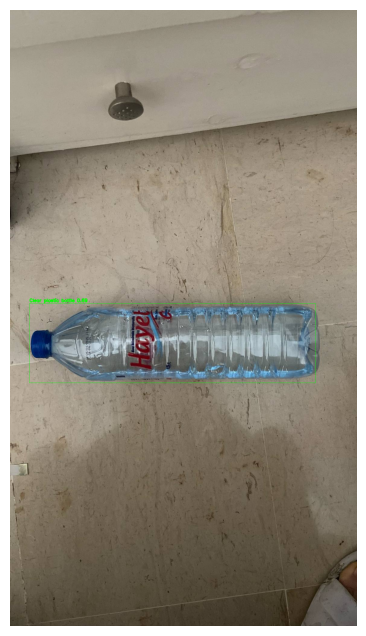

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



📝 Final Report:

The AI vision system detected a clear plastic bottle in the image. The bottle has a mass of about 1093 grams, which is equivalent to about 0.23 pounds. The bottle is likely to be a water bottle, as it is transparent and has a cylindrical shape. The bottle may have been used to store or transport water, or to drink from. The bottle may also have some labels or markings on it, indicating its origin, brand, or expiration date. The bottle may be recyclable or reusable, depending on its material and condition.


In [ ]:
img_path = "test20.jpg"

# Run detection pipeline
summary = process_image(img_path)

# Generate LLM report
report = generate_report_with_phi2(summary["objects"], phi2_pipeline=llm)

# Show it
print("\n📝 Final Report:\n")
print(report)


**XIA : YOLO**

grad-cam

Utilise les gradients des prédictions par rapport aux activations pour créer une carte de chaleur montrant quelles zones ont le plus contribué à la prédiction. Elle est efficace pour comprendre comment chaque objet dans l'image affecte la sortie du modèle en mettant l'accent sur les zones importantes.

[0] Classe 5 (Clear plastic bottle)


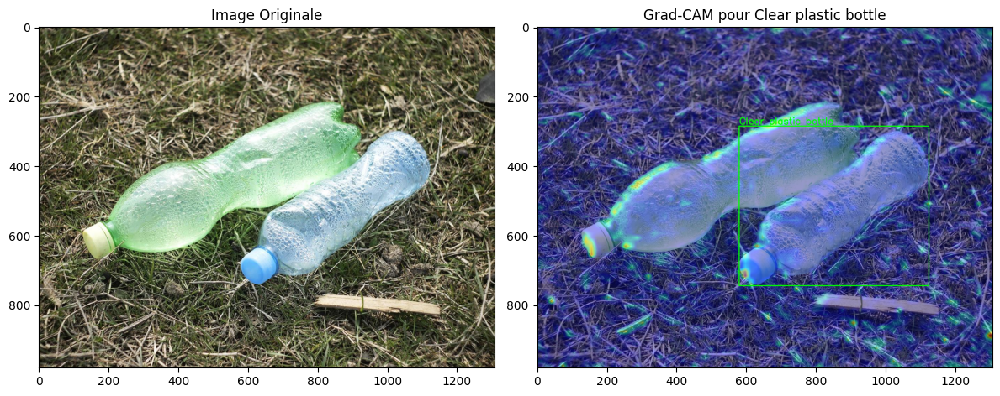

[1] Classe 7 (Plastic bottle cap)


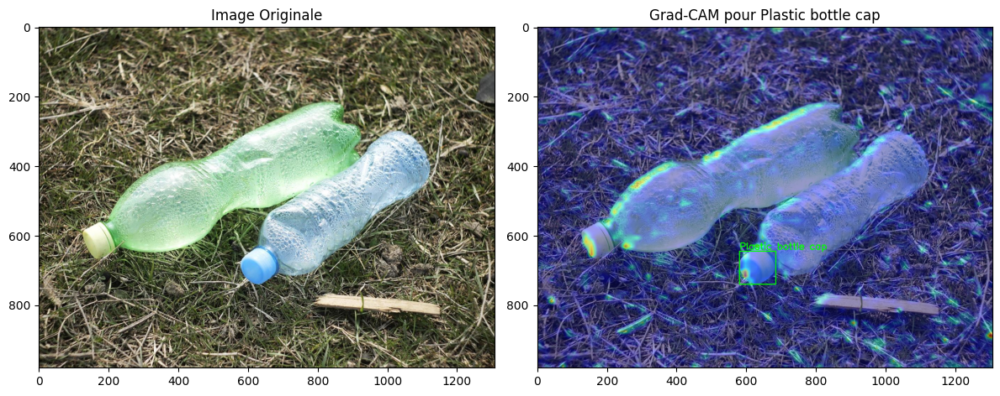

[2] Classe 5 (Clear plastic bottle)


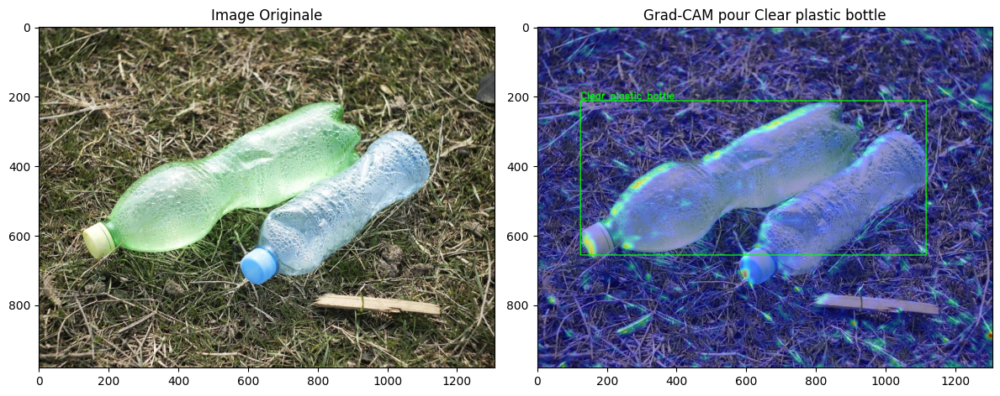

[3] Classe 7 (Plastic bottle cap)


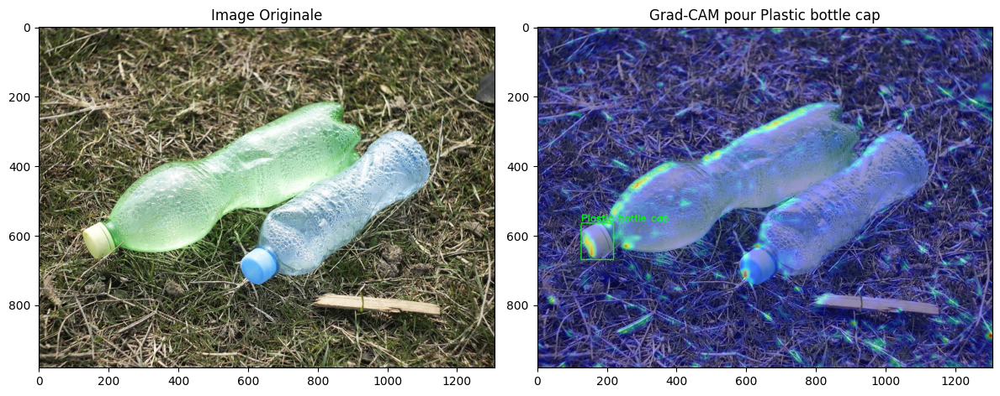

In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from torchvision import transforms

model.eval()

# Paramètres
img_size = 640
img_path = "test11.jpg"
original_img = cv2.imread(img_path)
rgb_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Prétraitement
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
img_tensor = transform(rgb_img).unsqueeze(0).to(model.device)
img_tensor.requires_grad_(True)

# Prédiction
results = model.predict(img_path, verbose=False)
result = results[0]

if len(result.boxes) == 0:
    print("Aucune détection.")
else:
    boxes = result.boxes
    names = result.names

    # Hook
    activations = []
    gradients = []

    def forward_hook(module, input, output):
        activations.append(output.detach())

    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach())

    # Cible Grad-CAM
    target_layer = model.model.model[22].cv3[0][0].conv
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_backward_hook(backward_hook)

    # Forward pass
    model.zero_grad()
    outputs = model.model(img_tensor)

    y = outputs[0][0]  # Shape: (bs, anchors, grid_y, grid_x, classes+5)

    for i, box in enumerate(boxes):
        cls_id = int(box.cls.item())
        cls_name = names[cls_id]
        print(f"[{i}] Classe {cls_id} ({cls_name})")

        # Réinitialiser les containers
        activations = []
        gradients = []

        # Enregistrer les hooks À L’INTÉRIEUR DE LA BOUCLE
        forward_handle = target_layer.register_forward_hook(forward_hook)
        backward_handle = target_layer.register_backward_hook(backward_hook)

        # Forward
        model.zero_grad()
        outputs = model.model(img_tensor)

        y = outputs[0][0]
        confidences = y[..., 4]
        class_scores = y[..., 5 + cls_id]
        combined_scores = confidences * class_scores
        loss = combined_scores.sum()

        # Backward
        loss.backward(retain_graph=True)

        # Vérification de la présence des données
        if len(activations) == 0 or len(gradients) == 0:
            print(f" Aucun hook déclenché pour {cls_name} — skip.")
            forward_handle.remove()
            backward_handle.remove()
            continue

        grads = gradients[0].cpu().numpy().squeeze()
        acts = activations[0].cpu().numpy().squeeze()
        weights = np.mean(grads, axis=(1, 2), keepdims=True)
        cam = np.sum(weights * acts, axis=0)
        cam = np.maximum(cam, 0)
        cam = (cam - cam.min()) / (cam.max() - cam.min()) if cam.max() > cam.min() else np.zeros_like(cam)

        cam_resized = cv2.resize(cam, (original_img.shape[1], original_img.shape[0]))
        heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(original_img, 0.6, heatmap, 0.4, 0)

        # Bbox
        xyxy = box.xyxy[0].cpu().numpy().astype(int)
        x1, y1, x2, y2 = xyxy
        cv2.rectangle(superimposed_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(superimposed_img, f"{cls_name}", (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

        # Affichage
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.title('Image Originale')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title(f'Grad-CAM pour {cls_name}')
        plt.tight_layout()
        plt.show()

        # Retirer les hooks
        forward_handle.remove()
        backward_handle.remove()



eigen-cam

Utilise les vecteurs propres des activations pour générer une carte de chaleur interprétable, permettant de visualiser les régions de l'image influençant la prédiction de manière détaillée. Choisie pour sa capacité à extraire des informations précises à partir des activations des couches profondes du modèle.


Détection 1: Classe 5 (Clear plastic bottle)
Shape des activations: (192, 80, 80)
Valeurs EigenCAM min/max: 0.0000 / 1.0000


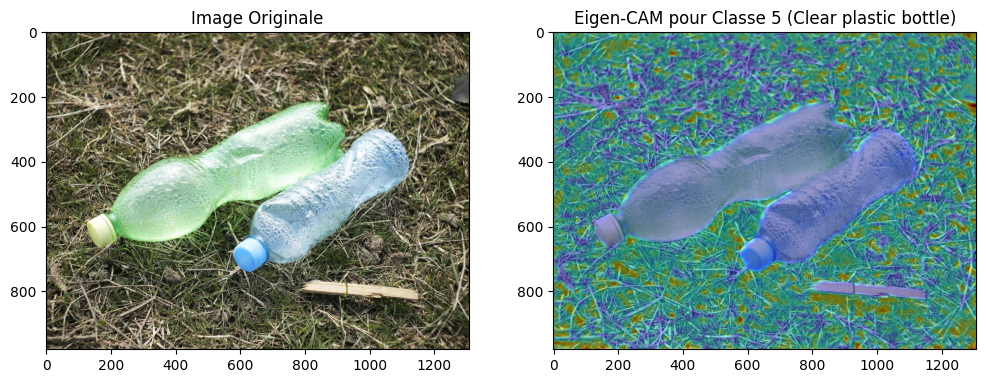


Détection 2: Classe 7 (Plastic bottle cap)
Shape des activations: (192, 80, 80)
Valeurs EigenCAM min/max: 0.0000 / 1.0000


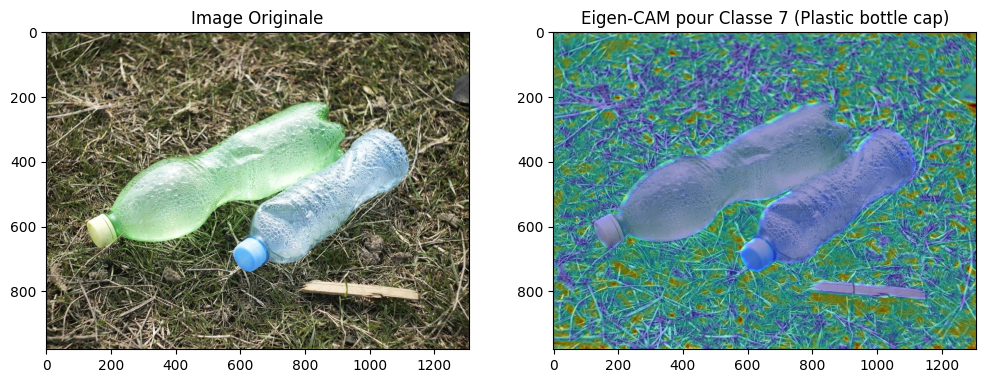


Détection 3: Classe 5 (Clear plastic bottle)
Shape des activations: (192, 80, 80)
Valeurs EigenCAM min/max: 0.0000 / 1.0000


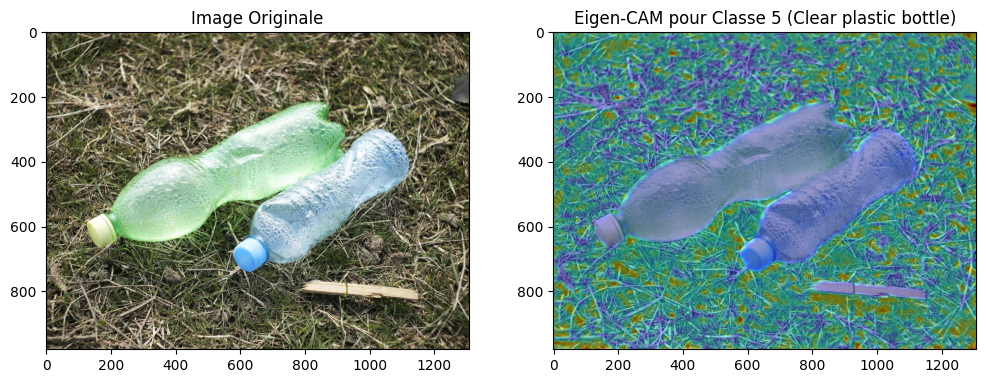


Détection 4: Classe 7 (Plastic bottle cap)
Shape des activations: (192, 80, 80)
Valeurs EigenCAM min/max: 0.0000 / 1.0000


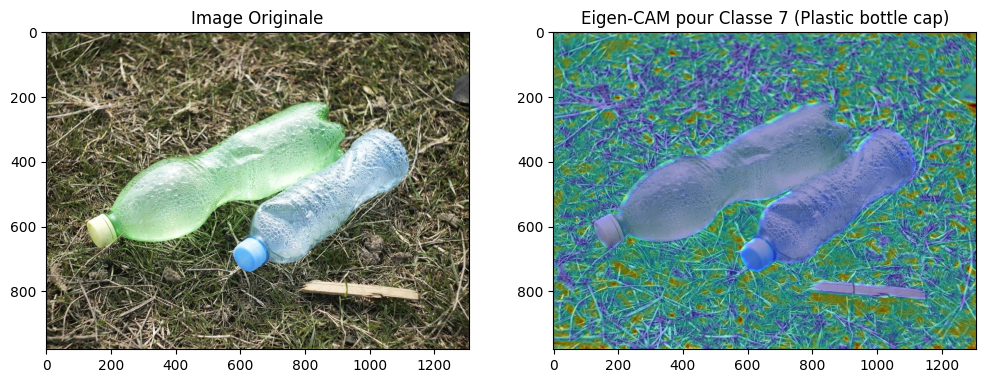

In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from torchvision import transforms
from scipy.linalg import svd

model.eval()

# Paramètres
img_size = 640
img_path = "test11.jpg"

# Chargement de l'image
original_img = cv2.imread(img_path)
rgb_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Prétraitement
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
img_tensor = transform(rgb_img).unsqueeze(0).to(model.device)
img_tensor.requires_grad_(True)

# Inference YOLO
results = model.predict(img_path, verbose=False)
result = results[0]

if len(result.boxes) == 0:
    print("Aucune détection.")
else:
    for i, box in enumerate(result.boxes):
        cls_id = int(box.cls)
        cls_name = result.names[cls_id]
        print(f"\nDétection {i+1}: Classe {cls_id} ({cls_name})")

        # Récupérer les activations via hook
        activations = []

        def forward_hook(module, input, output):
            activations.append(output.detach())

        target_layer = model.model.model[22].cv3[0][0].conv
        forward_handle = target_layer.register_forward_hook(forward_hook)

        # Forward pass avec gradients
        model.zero_grad()
        outputs = model.model(img_tensor)

        y = outputs[0][0]  # Shape: (bs, anchors, grid_y, grid_x, classes+5)
        confidences = y[..., 4]
        class_scores = y[..., 5 + cls_id]
        combined_scores = confidences * class_scores

        # Backpropagation
        loss = combined_scores.sum()
        loss.backward()

        # Traitement activations
        acts = activations[0].cpu().numpy().squeeze()
        print(f"Shape des activations: {acts.shape}")

        acts_flattened = acts.reshape(acts.shape[0], -1)
        u, s, vh = svd(acts_flattened, full_matrices=False)
        eig_vecs = u[:, 0]

        eigencam = np.dot(eig_vecs, acts_flattened)
        eigencam = eigencam.reshape(acts.shape[1], acts.shape[2])
        eigencam = np.maximum(eigencam, 0)
        eigencam = (eigencam - eigencam.min()) / (eigencam.max() - eigencam.min()) if eigencam.max() > eigencam.min() else np.zeros_like(eigencam)

        print(f"Valeurs EigenCAM min/max: {eigencam.min():.4f} / {eigencam.max():.4f}")

        # Redimensionner à la taille originale
        eigencam = cv2.resize(eigencam, (original_img.shape[1], original_img.shape[0]))
        heatmap = cv2.applyColorMap(np.uint8(255 * eigencam), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(original_img, 0.6, heatmap, 0.4, 0)

        # Visualisation
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.title("Image Originale")

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Eigen-CAM pour Classe {cls_id} ({cls_name})")
        plt.show()

        forward_handle.remove()


-> Ces deux méthodes aident à expliquer et visualiser les prédictions de YOLO, qui est une architecture complexe de détection d'objets, en mettant en évidence les zones d’intérêt pour chaque classe détectée.

approche hybride

**Pourquoi les combiner :** L’EigenCAM offre une perspective globale et quantitative des activations, tandis que le Grad-CAM affine cette vision en se concentrant sur les zones d’importance en termes de gradients. La combinaison fournit une interprétation plus robuste et détaillée.

**Comment ça marche ensemble :** L’EigenCAM donne une idée générale des activations principales, tandis que le Grad-CAM montre précisément les régions influençant la décision finale. Ensemble, ils offrent une analyse plus complète des motifs d'attention du modèle.

[0] Classe 40 (Single-use carrier bag)


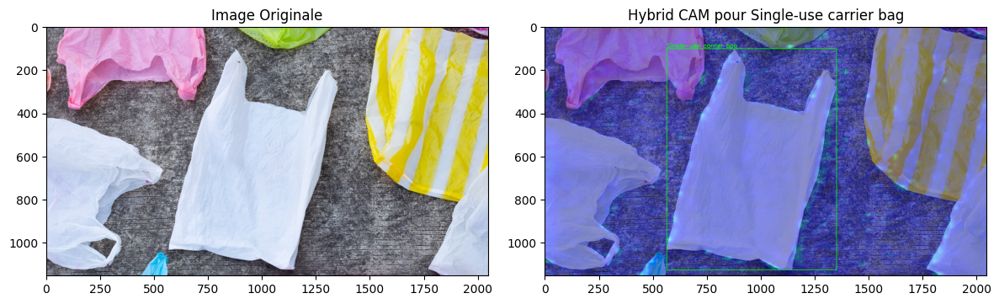

[1] Classe 39 (Other plastic wrapper)


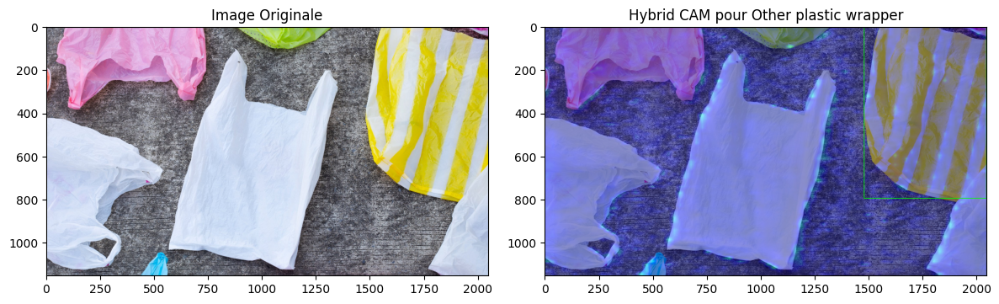

[2] Classe 40 (Single-use carrier bag)


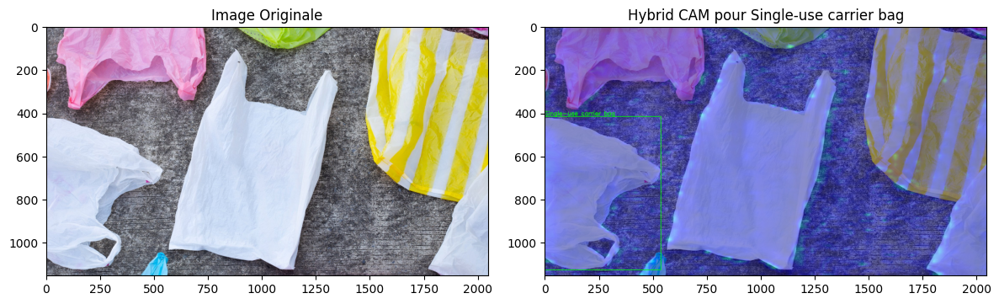

[3] Classe 12 (Drink can)


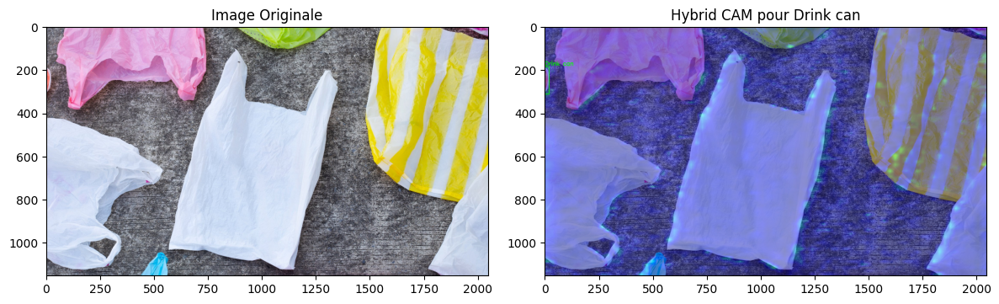

In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from torchvision import transforms
from scipy.linalg import svd

# Initialisation du modèle
model.eval()

# Paramètres
img_size = 640
img_path = "test12.jpg"

# Chargement de l'image
original_img = cv2.imread(img_path)
rgb_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Prétraitement
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
img_tensor = transform(rgb_img).unsqueeze(0).to(model.device)
img_tensor.requires_grad_(True)

# Prédiction avec YOLO
results = model.predict(img_path, verbose=False)
result = results[0]

if len(result.boxes) == 0:
    print("Aucune détection.")
else:
    boxes = result.boxes
    names = result.names

    # Hooks pour activations et gradients
    activations = []
    gradients = []

    def forward_hook(module, input, output):
        activations.append(output.detach())

    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach())

    # Cible Grad-CAM
    target_layer = model.model.model[22].cv3[0][0].conv
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_backward_hook(backward_hook)

    # Boucle pour chaque détection
    for i, box in enumerate(boxes):
        cls_id = int(box.cls.item())
        cls_name = names[cls_id]
        print(f"[{i}] Classe {cls_id} ({cls_name})")

        # Réinitialisation des containers pour chaque itération
        activations.clear()
        gradients.clear()

        # Forward pass
        model.zero_grad()
        outputs = model.model(img_tensor)
        y = outputs[0][0]  # Shape: (bs, anchors, grid_y, grid_x, classes+5)
        confidences = y[..., 4]
        class_scores = y[..., 5 + cls_id]
        combined_scores = confidences * class_scores
        loss = combined_scores.sum()

        # Backward pass
        loss.backward(retain_graph=True)

        # Vérification de la présence des données
        if len(activations) == 0 or len(gradients) == 0:
            print(f" Aucun hook déclenché pour {cls_name} — skip.")
            continue

        # Grad-CAM
        grads = gradients[0].cpu().numpy().squeeze()
        acts = activations[0].cpu().numpy().squeeze()
        weights = np.mean(grads, axis=(1, 2), keepdims=True)
        grad_cam = np.sum(weights * acts, axis=0)
        grad_cam = np.maximum(grad_cam, 0)
        grad_cam = (grad_cam - grad_cam.min()) / (grad_cam.max() - grad_cam.min()) if grad_cam.max() > grad_cam.min() else np.zeros_like(grad_cam)

        # Eigen-CAM
        acts_flattened = acts.reshape(acts.shape[0], -1)
        u, s, vh = svd(acts_flattened, full_matrices=False)
        eig_vecs = u[:, 0]
        eigencam = np.dot(eig_vecs, acts_flattened)
        eigencam = eigencam.reshape(acts.shape[1], acts.shape[2])
        eigencam = np.maximum(eigencam, 0)
        eigencam = (eigencam - eigencam.min()) / (eigencam.max() - eigencam.min()) if eigencam.max() > eigencam.min() else np.zeros_like(eigencam)

        # Combinaison des deux cartes
        hybrid_cam = 0.5 * grad_cam + 0.5 * eigencam  # Pondération des deux approches

        # Redimensionner et appliquer la carte thermique hybride
        hybrid_cam_resized = cv2.resize(hybrid_cam, (original_img.shape[1], original_img.shape[0]))
        heatmap = cv2.applyColorMap(np.uint8(255 * hybrid_cam_resized), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(original_img, 0.6, heatmap, 0.4, 0)

        # Ajouter la boîte de détection sur l'image
        xyxy = box.xyxy[0].cpu().numpy().astype(int)
        x1, y1, x2, y2 = xyxy
        cv2.rectangle(superimposed_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(superimposed_img, f"{cls_name}", (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

        # Affichage
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.title('Image Originale')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title(f'Hybrid CAM pour {cls_name}')
        plt.tight_layout()
        plt.show()

        # Retirer les hooks
        forward_handle.remove()
        backward_handle.remove()


Text/Token attribution via similarity drop

In [ ]:
import clip
from PIL import Image
import torch

image = preprocess_clip(Image.open("test6.jpg")).unsqueeze(0).to(device)
text = clip.tokenize(["a photo of a flower", "a photo of a green glass bottle"]).to(device)

with torch.no_grad():
    image_features = clip_model.encode_image(image)
    text_features = clip_model.encode_text(text)

    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    similarity = (image_features @ text_features.T).softmax(dim=-1)
    print("Similarity:", similarity)


Similarity: tensor([[0.4734, 0.5269]], device='cuda:0', dtype=torch.float16)


-> 0.4734 corresponds to the similarity between the image and the description "a photo of a flower"
0.5215 corresponds to the similarity between the image and the description "a photo of a green glass bottle"
(en vérité c est une photo de green glass bottle)